# 1. Data Acquitition

In [1]:
# install library kaggle
!pip install -q kaggle

In [2]:
# upload kaggle.json yang sudah di download
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"daniharmade","key":"a59aad4a13256e88d81b41745058c123"}'}

In [3]:
# make directory and change permission
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle

kaggle.json


In [4]:
# download Dataset
!kaggle datasets download -d alvinbintang/sibi-dataset

Dataset URL: https://www.kaggle.com/datasets/alvinbintang/sibi-dataset
License(s): copyright-authors


In [5]:
# unzip dataset
!unzip sibi-dataset

Streaming output truncated to the last 5000 lines.
  inflating: SIBI/B/1645946451.0243402_B.jpg  
  inflating: SIBI/B/1645946454.6260056_U.jpg  
  inflating: SIBI/B/1645946456.4885087_F.jpg  
  inflating: SIBI/B/1645946460.4972847_B.jpg  
  inflating: SIBI/B/1645946463.7729926_B.jpg  
  inflating: SIBI/B/1645946467.532869_B.jpg  
  inflating: SIBI/B/1645949132.0273714_B.jpg  
  inflating: SIBI/B/1645949136.465165_B.jpg  
  inflating: SIBI/B/1645949142.7455149_B.jpg  
  inflating: SIBI/B/1645949858.470701_Q.jpg  
  inflating: SIBI/B/1645949859.1649747_C.jpg  
  inflating: SIBI/B/1645949859.858002_Q.jpg  
  inflating: SIBI/B/1645949860.5160742_G.jpg  
  inflating: SIBI/B/1645949860.9303768_C.jpg  
  inflating: SIBI/B/1645949863.3891625_C.jpg  
  inflating: SIBI/B/1645949864.6113553_C.jpg  
  inflating: SIBI/B/1645950338.9793453_C.jpg  
  inflating: SIBI/B/1645950339.6984558_C.jpg  
  inflating: SIBI/B/1645950340.2939713_C.jpg  
  inflating: SIBI/B/1645950341.0949953_C.jpg  
  inflating: 

# 2. Data Preparation

In [6]:
# Memisahkan data training, testing, dan validasi
# warnings.filterwarnings("ignore")
import os
import shutil
from sklearn.model_selection import train_test_split

original_data_dir = 'SIBI'
base_dir = 'data_split'

train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Buat folder target
for directory in [train_dir, val_dir, test_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

# Bagi data tiap kelas ke train/val/test
for class_name in os.listdir(original_data_dir):
    class_path = os.path.join(original_data_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = os.listdir(class_path)
    # images = [img for img in images if img.endswith(('jpg', 'jpeg', 'png'))]
    images = [img for img in images]

    train_imgs, temp_imgs = train_test_split(images, test_size=0.2, random_state=42)
    val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=42)

    for img_set, folder in zip([train_imgs, val_imgs, test_imgs], [train_dir, val_dir, test_dir]):
        class_folder = os.path.join(folder, class_name)
        os.makedirs(class_folder, exist_ok=True)
        for img in img_set:
            src = os.path.join(class_path, img)
            dst = os.path.join(class_folder, img)
            shutil.copy(src, dst)

print("✅ Data splitting selesai.")

✅ Data splitting selesai.


In [7]:
# Menampilkan jumlah data pada setiap pembagian data
from collections import defaultdict

def count_images_per_class(data_dir):
    class_counts = defaultdict(int)
    for class_name in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):
            # num_images = len([img for img in os.listdir(class_path) if img.endswith(('jpg', 'jpeg', 'png'))])
            num_images = len([img for img in os.listdir(class_path)])
            class_counts[class_name] = num_images
    return class_counts

# Tampilkan jumlah data per kelas untuk masing-masing set
print("📊 Jumlah data per kelas:")
print("\n[TRAIN]")
train_counts = count_images_per_class(train_dir)
for k, v in train_counts.items():
    print(f"{k}: {v} gambar")

print("\n[VALIDASI]")
val_counts = count_images_per_class(val_dir)
for k, v in val_counts.items():
    print(f"{k}: {v} gambar")

print("\n[TESTING]")
test_counts = count_images_per_class(test_dir)
for k, v in test_counts.items():
    print(f"{k}: {v} gambar")

📊 Jumlah data per kelas:

[TRAIN]
W: 176 gambar
S: 176 gambar
C: 176 gambar
L: 176 gambar
I: 176 gambar
U: 176 gambar
P: 176 gambar
X: 176 gambar
V: 176 gambar
Y: 176 gambar
G: 176 gambar
N: 176 gambar
M: 176 gambar
O: 176 gambar
H: 176 gambar
Q: 176 gambar
A: 176 gambar
D: 176 gambar
E: 176 gambar
T: 176 gambar
F: 176 gambar
B: 176 gambar
K: 176 gambar
R: 176 gambar

[VALIDASI]
W: 22 gambar
S: 22 gambar
C: 22 gambar
L: 22 gambar
I: 22 gambar
U: 22 gambar
P: 22 gambar
X: 22 gambar
V: 22 gambar
Y: 22 gambar
G: 22 gambar
N: 22 gambar
M: 22 gambar
O: 22 gambar
H: 22 gambar
Q: 22 gambar
A: 22 gambar
D: 22 gambar
E: 22 gambar
T: 22 gambar
F: 22 gambar
B: 22 gambar
K: 22 gambar
R: 22 gambar

[TESTING]
W: 22 gambar
S: 22 gambar
C: 22 gambar
L: 22 gambar
I: 22 gambar
U: 22 gambar
P: 22 gambar
X: 22 gambar
V: 22 gambar
Y: 22 gambar
G: 22 gambar
N: 22 gambar
M: 22 gambar
O: 22 gambar
H: 22 gambar
Q: 22 gambar
A: 22 gambar
D: 22 gambar
E: 22 gambar
T: 22 gambar
F: 22 gambar
B: 22 gambar
K: 22 gam

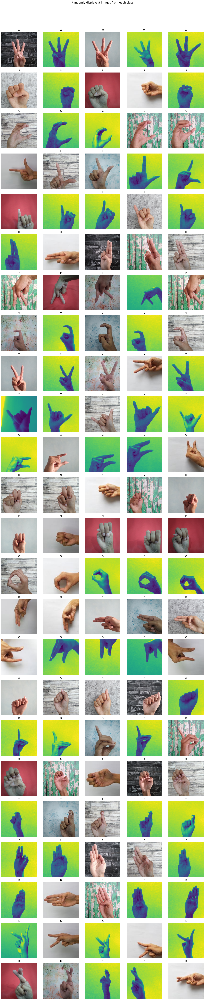

In [8]:
import os
import random
import matplotlib.pyplot as plt

# Direktori utama data gambar
data_dir = '/content/data_split/train'

# List nama kelas
class_names = os.listdir(data_dir)

# Membuat subplot dengan 5 kolom (1 kolom untuk setiap kelas)
# Menyesuaikan jumlah baris dengan jumlah kelas
fig, axes = plt.subplots(len(class_names), 5, figsize=(15, 3 * len(class_names)))
fig.suptitle("Randomly displays 5 images from each class", fontsize=14)

for i, class_name in enumerate(class_names):
    class_dir = os.path.join(data_dir, class_name)
    class_images = os.listdir(class_dir)

    # Memilih secara acak 5 gambar dari setiap kelas
    selected_images = random.sample(class_images, 5)

    # Menampilkan gambar-gambar yang dipilih
    for j, image_filename in enumerate(selected_images):
        img = plt.imread(os.path.join(class_dir, image_filename))
        axes[i, j].imshow(img)
        axes[i, j].set_title(class_name)
        axes[i, j].axis('off')  # Menonaktifkan axis

# Menghilangkan grid yang tidak terpakai (jika ada)
for i in range(len(class_names)):
    for j in range(5, len(selected_images)):
        axes[i, j].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Menyesuaikan jarak judul subplot
plt.show()


# 3. Data Augmentation

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.05,
    horizontal_flip=True,  # Hanya jika gesture tangan simetris
    vertical_flip=False,   # Dihindari agar tidak membuat gesture menjadi tidak valid
    fill_mode="nearest"
)

val_test_datagen = ImageDataGenerator(rescale=1./255)


In [10]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 4224 images belonging to 24 classes.
Found 528 images belonging to 24 classes.
Found 528 images belonging to 24 classes.


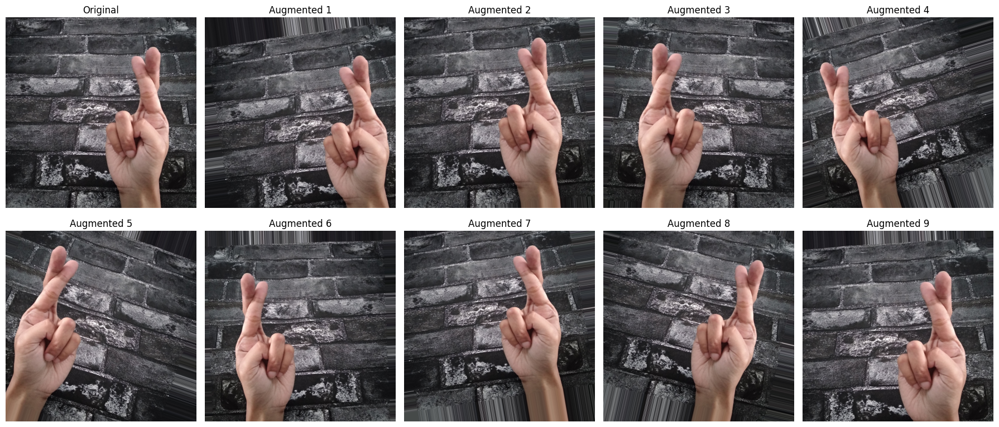

In [11]:
# Visualisasi hasil augmentasi
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
# import random

# Direktori data training
data_dir = train_dir

# List nama kelas yang tersedia di direktori training
class_names = os.listdir(data_dir)
class_names = [name for name in class_names if os.path.isdir(os.path.join(data_dir, name))]

if not class_names:
    print("❌ Tidak ada direktori kelas ditemukan di", train_dir)
else:
    # Memilih satu kelas secara acak
    selected_class = random.choice(class_names)

    # Mendapatkan daftar gambar dari kelas yang dipilih
    class_dir = os.path.join(data_dir, selected_class)
    class_images = os.listdir(class_dir)
    class_images = [img for img in class_images] # Memastikan hanya file gambar

    if not class_images:
        print(f"❌ Tidak ada gambar ditemukan di direktori kelas: {selected_class}")
    else:
        # Memilih secara acak satu gambar dari kelas yang dipilih
        selected_image = random.choice(class_images)

        # Memuat gambar dan mengonversi menjadi larik numpy
        img_path = os.path.join(class_dir, selected_image)
        try:
            img = plt.imread(img_path)
            img_array = img_to_array(img)
            img_array = img_array.reshape((1,) + img_array.shape)  # Mengubah dimensi menjadi (1, height, width, channels)

            # Menghasilkan augmented images
            augmented_images = []
            for batch in train_datagen.flow(img_array, batch_size=1):
                augmented_images.append(array_to_img(batch[0]))
                if len(augmented_images) >= 9:  # Menampilkan 9 variasi augmentasi
                    break

            # Tampilkan dalam grid 2x5
            plt.figure(figsize=(18, 8))
            # Gambar asli
            plt.subplot(2, 5, 1)
            plt.imshow(img)
            plt.title("Original", fontsize=12)
            plt.axis('off')

            # Gambar hasil augmentasi
            for i, augmented_img in enumerate(augmented_images):
                plt.subplot(2, 5, i+2)
                plt.imshow(augmented_img)
                plt.title(f"Augmented {i+1}", fontsize=12)
                plt.axis('off')

            plt.tight_layout()
            plt.show()

        except FileNotFoundError:
            print(f"❌ File tidak ditemukan: {img_path}")
        except Exception as e:
            print(f"❌ Terjadi kesalahan saat memproses gambar: {e}")

# 4. Pemodelan

In [12]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3

# Membuat model dasar InceptionV3 (pre-trained) tanpa lapisan klasifikasi teratas
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Menetapkan lapisan-lapisan dalam model dasar sebagai non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Membangun model Anda dengan menambahkan lapisan-lapisan klasifikasi kustom
model = tf.keras.models.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(24, activation='softmax')
])

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [13]:
# mendefinisikan callback Early Stopping dan Model Chekpoint
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

#  Early Stopping akan menghentikan pelatihan lebih awal jika kriteria tertentu tidak terpenuhi
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",         # Mengindikasikan metrik yang akan diamati selama pelatihan model
    min_delta=0.001,            # Nilai minimum perubahan yang harus terjadi dalam metrik yang diamati agar pelatihan tetap berlanjut
    patience=5,                 # Berapa banyak epoch yang harus berlalu tanpa ada peningkatan sebelum pelatihan dihentikan
    mode="auto",
    verbose=1,
    baseline=None,
    restore_best_weights=True   # Model akan dikembalikan ke bobot terbaik yang telah dicapai selama pelatihan sebelum dihentikan
)

# Model Chekpoint akan menyimpan bobot terbaik selama pelatihan
checkpoint_path = 'model_checkpoints/best_model.weights.h5'
checkpoint_dir = os.path.dirname(checkpoint_path)
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',         # metrik yang akan diamati saat menyimpan bobot
    mode='min',
    save_best_only=True,        # menyimpan bobot model terbaik berdasarkan metrik yang diamati
    save_weights_only=True,
    verbose=1
)

In [14]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer=RMSprop(learning_rate=0.001), #1e-4
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24)             │        12,312 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,864,184 (87.22 MB)

 Trainable params: 1,061,400 (4.05 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [15]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=15,
    callbacks=[early_stop, checkpoint]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2094 - loss: 3.5752
Epoch 1: val_loss improved from inf to 1.29285, saving model to model_checkpoints/best_model.weights.h5
132/132 ━━━━━━━━━━━━━━━━━━━━ 199s 1s/step - accuracy: 0.2103 - loss: 3.5670 - val_accuracy: 0.6174 - val_loss: 1.2928
Epoch 2/15
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5461 - loss: 1.4360
Epoch 2: val_loss improved from 1.29285 to 1.04683, saving model to model_checkpoints/best_model.weights.h5
132/132 ━━━━━━━━━━━━━━━━━━━━ 174s 1s/step - accuracy: 0.5463 - loss: 1.4354 - val_accuracy: 0.6420 - val_loss: 1.0468
Epoch 3/15
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6286 - loss: 1.1373
Epoch 3: val_loss improved from 1.04683 to 1.01542, saving model to model_checkpoints/best_model.weights.h5
132/132 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.6287 - loss: 1.1368 - val_accuracy: 0.6648 - val_loss: 1.0154
Epoch 4/15
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6783 -

# 5. Evaluasi

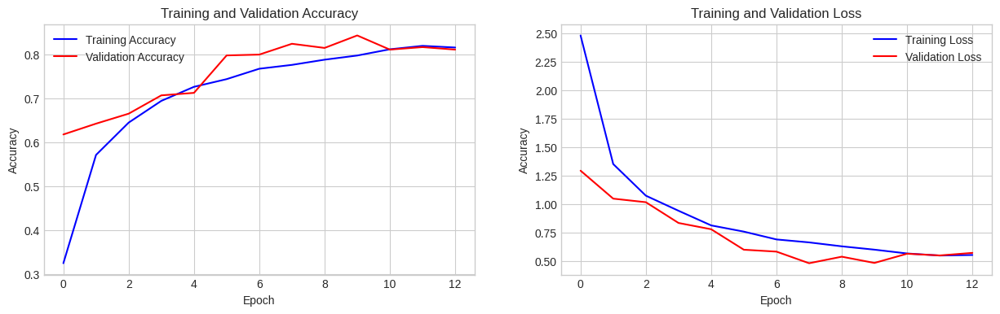

In [16]:
# plotting hasil training
plt.style.use('seaborn-v0_8-whitegrid')

def plot_acc(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  epochs = range(len(acc))
  plt.subplot(1, 2, 1)
  acc_plot, = plt.plot(epochs, acc, 'b')
  val_acc_plot, = plt.plot(epochs, val_acc, 'r')
  plt.title('Training and Validation Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend([acc_plot, val_acc_plot], ['Training Accuracy', 'Validation Accuracy'])

def plot_loss(history):
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(len(loss))
  plt.subplot(1, 2, 2)
  loss_plot, = plt.plot(epochs, loss, 'b')
  val_loss_plot, = plt.plot(epochs, val_loss, 'r')
  plt.title('Training and Validation Loss')
  plt.legend([loss_plot, val_loss_plot], ['Training Loss', 'Validation Loss'])

def plot_history(history):
  plt.figure(figsize=(15,4))
  plot_acc(history)
  plot_loss(history)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')

plot_history(history)

In [17]:
# Load bobot terbaik model
model.load_weights('model_checkpoints/best_model.weights.h5')

In [18]:
# Evaluasi Model
import pandas as pd

train_result = model.evaluate(train_generator)
val_result = model.evaluate(val_generator)
test_result = model.evaluate(test_generator)

model_result = pd.DataFrame(zip(train_result, val_result, test_result),
                             columns=['Train', 'Validation', 'Testing'],
                             index=['Loss', "Accuracy"])

model_result

132/132 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - accuracy: 0.8497 - loss: 0.4406
17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 769ms/step - accuracy: 0.8050 - loss: 0.5022


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 789ms/step - accuracy: 0.8821 - loss: 0.3976


,Train,Validation,Testing
Loss,0.452267,0.478760,0.451773
Accuracy,0.845407,0.823864,0.850379


In [19]:
# Menampilkan classification report
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns

# Ambil prediksi dari model_resnet
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Ambil label asli
y_true = test_generator.classes

# Label mapping (index ke nama kelas)
class_labels = list(test_generator.class_indices.keys())

# Print classification report
print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

17/17 ━━━━━━━━━━━━━━━━━━━━ 23s 975ms/step

📊 Classification Report:

              precision    recall  f1-score   support

           A       0.88      1.00      0.94        22
           B       0.88      1.00      0.94        22
           C       0.88      0.95      0.91        22
           D       1.00      1.00      1.00        22
           E       1.00      0.73      0.84        22
           F       1.00      0.73      0.84        22
           G       1.00      0.68      0.81        22
           H       0.87      0.91      0.89        22
           I       0.59      0.73      0.65        22
           K       0.80      0.73      0.76        22
           L       0.88      0.95      0.91        22
           M       0.83      0.68      0.75        22
           N       0.69      0.82      0.75        22
           O       0.95      0.95      0.95        22
           P       0.96      1.00      0.98        22
           Q       1.00      1.00      1.00        22
           R

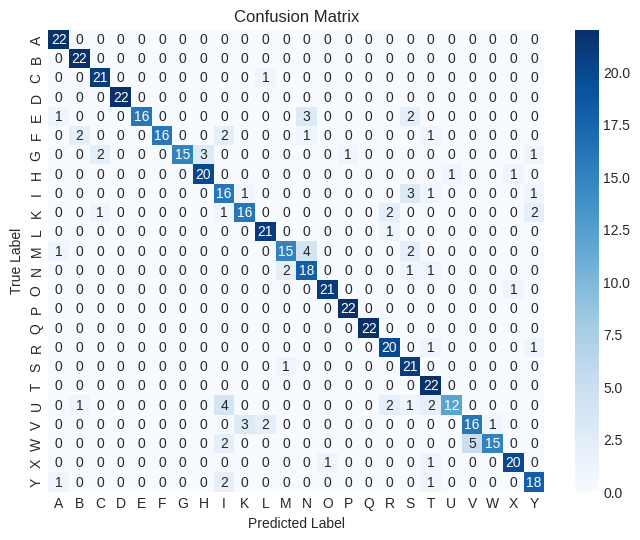

In [20]:
# Menampilkan confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

✅ Nama kelas berhasil diambil dari train_generator: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y']


Saving 1645708667.8551557.jpg to 1645708667.8551557.jpg
Gambar '1645708667.8551557.jpg' berhasil diunggah.


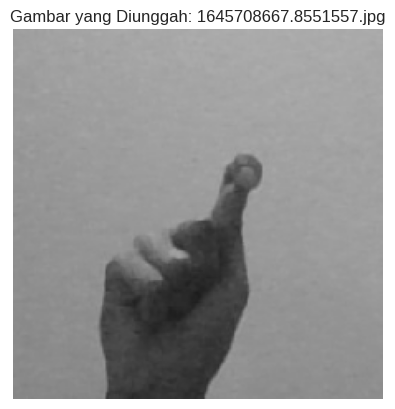

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step

=== Hasil Prediksi ===
File Gambar: 1645708667.8551557.jpg
Kelas Prediksi: T

Probabilitas Setiap Kelas:
   Images   Probability
0       A  2.789149e-07
1       B  1.397808e-09
2       C  5.482886e-08
3       D  1.141648e-09
4       E  5.651698e-09
5       F  9.038539e-09
6       G  5.463692e-10
7       H  5.683968e-09
8       I  5.768643e-04
9       K  3.243981e-09
10      L  8.155515e-07
11      M  9.703195e-08
12      N  1.123022e-06
13      O  2.161322e-11
14      P  8.111863e-10
15      Q  3.248869e-11
16      R  8.783564e-04
17      S  2.847407e-06
18      T  9.984242e-01
19      U  1.704175e-06
20      V  2.028433e-09
21      W  7.518819e-14
22      X  6.502643e-06
23      Y  1.071528e-04


In [21]:
import numpy as np
import tensorflow as tf
import pandas as pd
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
import io
from google.colab import files

# Asumsikan model sudah dimuat/didefinisikan

# fungsi untuk mengklasifikasi gambar (sama seperti sebelumnya)
def predict_image(image_upload, model=None, class_names=None):
    if model is None:
        print("Error: Model belum didefinisikan.")
        return None, None
    if class_names is None:
        print("Error: Nama kelas belum didefinisikan.")
        return None, None

    im = image_upload
    im_array = np.asarray(im)
    im_array = im_array * (1 / 255.0)
    im_input = tf.reshape(im_array, shape=[1, 224, 224, 3])

    predict_array = model.predict(im_input)[0]

    df_predict = pd.DataFrame(predict_array, columns=['Probability'])
    df_predict['Images'] = class_names
    df_predict = df_predict[['Images', 'Probability']]

    predicted_label_index = np.argmax(predict_array)
    predicted_product = class_names[predicted_label_index]

    return predicted_product, df_predict

# Asumsikan model sudah dimuat
try:
    if 'model' not in locals() or model is None:
        model = tf.keras.models.load_model('model_checkpoints/best_model.weights.h5')
        print("✅ Model berhasil dimuat.")
except Exception as e:
    print(f"❌ Gagal memuat model: {e}")
    model = None

# Ambil nama kelas dari train_generator
try:
    if 'train_generator' in locals() and train_generator is not None:
        class_names_from_generator = list(train_generator.class_indices.keys())
        print("✅ Nama kelas berhasil diambil dari train_generator:", class_names_from_generator)

        uploaded = files.upload()

        if uploaded:
            for filename in uploaded.keys():
                print(f"Gambar '{filename}' berhasil diunggah.")

                # Memuat gambar yang diunggah
                uploaded_image = uploaded[filename]
                img = load_img(io.BytesIO(uploaded_image), target_size=(224, 224))
                img_array = img_to_array(img)
                plt.imshow(img)
                plt.title(f"Gambar yang Diunggah: {filename}")
                plt.axis('off')
                plt.show()

                if model is not None:
                    predicted_class, probability_df = predict_image(img_array, model=model, class_names=class_names_from_generator)
                    print("\n=== Hasil Prediksi ===")
                    print("File Gambar:", filename)
                    print("Kelas Prediksi:", predicted_class)
                    print("\nProbabilitas Setiap Kelas:")
                    print(probability_df)
                else:
                    print("\n⚠️ Tidak dapat melakukan prediksi karena model belum dimuat.")
        else:
            print("Tidak ada file yang diunggah.")

    else:
        print("❌ train_generator belum didefinisikan, tidak dapat mengambil nama kelas.")

except NameError:
    print("❌ Variabel train_generator tidak ditemukan.")
except ImportError:
    print("❌ Modul 'google.colab' tidak ditemukan. Pastikan Anda menjalankan kode di Google Colab.")
except Exception as e:
    print(f"❌ Terjadi kesalahan: {e}")